# Notebook de exploración con más detalle de los datos


## Data exploration

En este notebool se ha una exploración más profunda de los datos. Se realizan una inspección del tipo de datos de la cantidad de variables que contiene, sus metadatos y se hace una primera selección de los dataset filtrando por las clases que comparten todos los datasets

## Libreries

In [1]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os

## Load data

In [2]:
# Cambiar el directorio de trabajo
os.chdir("/home/a/Escritorio/TFM/src/NSForest/data/")#adata = sc.read_h5ad(data_folder + "adata_layer1.h5ad") #<---
adata_conway = sc.read_h5ad("Conway20.h5ad")
adata_dumas = sc.read_h5ad("Dumas20.h5ad")
adata_hinze = sc.read_h5ad("Hinze20.h5ad")
adata_janosevic = sc.read_h5ad("Janosevic21.h5ad")
adata_kirita = sc.read_h5ad("Kirita20.h5ad")
adata_miao = sc.read_h5ad("Miao21.h5ad")
adata_park = sc.read_h5ad("Park18.h5ad")
adata_wu = sc.read_h5ad("Wu19.h5ad")

In [3]:
adata_hinze

AnnData object with n_obs × n_vars = 30586 × 16653
    obs: 'Origin', 'suspension_type', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'author_cell_type', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'cell_type_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'is_primary_data', 'development_stage_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'donor_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: 'schema_version', 'title'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [4]:

# Convertir la matriz dispersa a un DataFrame de pandas
df = pd.DataFrame.sparse.from_spmatrix(adata_hinze.X)

# Verificar si hay valores nulos en el DataFrame
print("¿Existen valores nulos en el conjunto de datos?")
if df.isna().sum().sum() > 0:
    print("Sí, hay valores nulos en el conjunto de datos.")
else:
    print("No hay valores nulos en el conjunto de datos.")

¿Existen valores nulos en el conjunto de datos?
No hay valores nulos en el conjunto de datos.


In [5]:
# Verificar instancias duplicadas
duplicados = adata_hinze.obs.duplicated()
print("Número de instancias duplicadas:", duplicados.sum())

Número de instancias duplicadas: 0


In [6]:
adata_hinze.var

,feature_is_filtered,feature_name,feature_reference,feature_biotype
gene_ids,,,,
ENSMUSG00000026315,False,Serpinb8,NCBITaxon:10090,gene
ENSMUSG00000063558,False,Aox1,NCBITaxon:10090,gene
ENSMUSG00000001138,False,Cnnm3,NCBITaxon:10090,gene
ENSMUSG00000001143,False,Lman2l,NCBITaxon:10090,gene
ENSMUSG00000079610,False,Ankrd39,NCBITaxon:10090,gene
...,...,...,...,...
ENSMUSG00000069053,False,Uba1y,NCBITaxon:10090,gene
ENSMUSG00000096768,False,Gm47283,NCBITaxon:10090,gene
ENSMUSG00000095366,False,Gm21860,NCBITaxon:10090,gene


feature_is_filtered: Esta columna indica si la característica (en este caso, un gen) ha sido filtrada o no. Un valor de False significa que la característica no ha sido filtrada, mientras que un valor de True indicaría que la característica ha sido filtrada. El filtrado de características a menudo se realiza durante el preprocesamiento de datos para eliminar genes con baja expresión o alta variabilidad que pueden no ser informativos para el análisis.

feature_name: Esta columna contiene el nombre de la característica, que en este caso es el nombre del gen. Cada fila representa un gen diferente en el conjunto de datos de expresión génica.

feature_reference proporciona un identificador o referencia para la característica, que en este contexto parece ser el código de identificación del organismo. El código NCBITaxon:10090 corresponde al ratón, ya que es el identificador de taxonomía utilizado para representar al ratón en la base de datos del Centro Nacional para la Información Biotecnológica (NCBI).

feature_biotype: Esta columna indica el biotipo de la característica, es decir, el tipo de elemento genético que es. En este caso, todos los valores son "gene", lo que indica que todas las características son genes. Otros biotipos comunes pueden incluir "miRNA", "mRNA", "lncRNA", entre otros, dependiendo de la naturaleza del conjunto de datos de expresión génica.

In [11]:
# Estadísticas descriptivas de las características
print("Estadísticas descriptivas de las características:")
print(adata_hinze.var.describe())

Estadísticas descriptivas de las características:
       feature_is_filtered   feature_name feature_reference feature_biotype
count                16653          16653             16653           16653
unique                   1          16653                 1               1
top                  False  0610005C13Rik   NCBITaxon:10090            gene
freq                 16653              1             16653           16653


In [12]:
adata_hinze.uns

{'schema_version': '3.0.0', 'title': 'Healthy mouse kidney atlas'}

El resultado de adata_hinze.uns proporciona un diccionario que contiene información adicional o metadatos asociados con el conjunto de datos adata_hinze. Aquí está la explicación de los campos presentes en el diccionario:

    schema_version: Indica la versión del esquema utilizado para estructurar los metadatos. En este caso, la versión es '3.0.0'.

    title: Proporciona un título o nombre descriptivo para el conjunto de datos. En este caso, el título es 'Healthy mouse kidney atlas', lo que sugiere que el conjunto de datos representa un atlas de células de riñón de ratón en condiciones saludables.

    cell_type_colors: Es una lista de colores asociados con los diferentes tipos celulares presentes en el conjunto de datos. Cada color corresponde a un tipo celular específico y se utiliza comúnmente en visualizaciones para distinguir entre los diferentes tipos celulares en gráficos como mapas de t-SNE, gráficos de agrupamiento, entre otros.

In [13]:
# Paso 1: Visualizar la distribución de células por tipo celular (cluster)
fig = px.histogram(adata_hinze.obs, x='cell_type', title='Distribución de células por clase', labels={'cell_type': 'Tipo Celular', 'count': 'Número de Células'})
fig.update_layout(xaxis=dict(tickangle=45),
                  yaxis_title='Número de Células')
fig.update_traces(marker_color='skyblue', marker_line_color='black',
                  marker_line_width=1.5, opacity=0.6)
for annotation in fig.layout.annotations:
    annotation.text = annotation.text.split('=')[1]
fig.show()

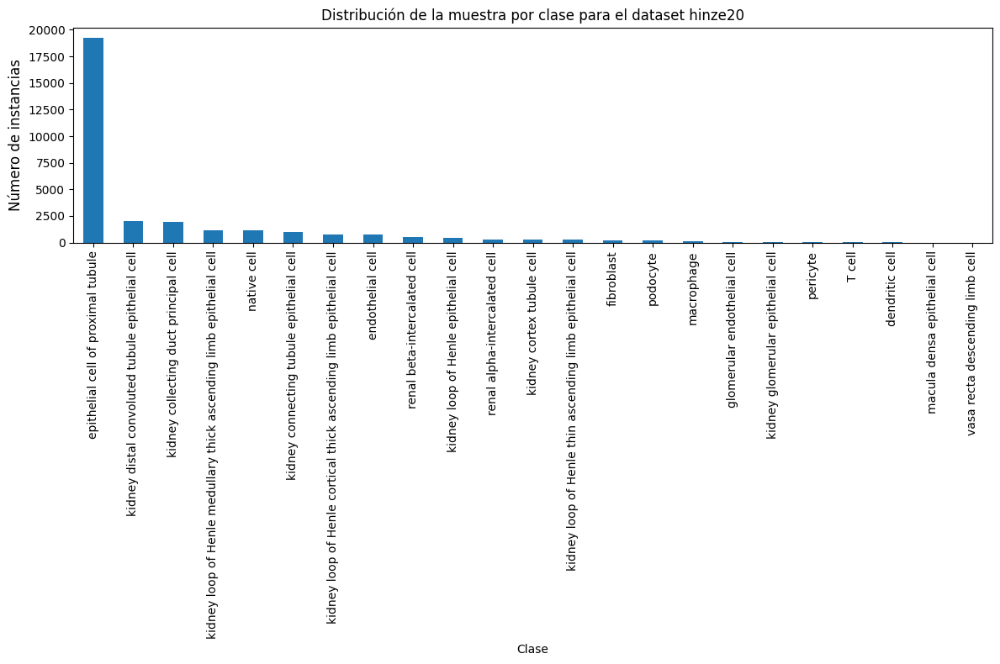

In [21]:

# Visualizar la distribución de la muestra por clase
plt.figure(figsize=(12, 8))  # Ajustar el tamaño de la figura
adata_hinze.obs['cell_type'].value_counts().plot(kind='bar')
plt.title('Distribución de la muestra por clase para el dataset hinze20')
plt.xlabel('Clase')
plt.ylabel('Número de instancias', fontsize=12)  # Aumentar el tamaño de la fuente del eje y
plt.tight_layout()  # Ajustar automáticamente los márgenes para evitar superposiciones
plt.savefig('/home/a/Escritorio/TFM/plots/distribucion_muestra.png')
plt.show()

/tmp/ipykernel_4863/3296520284.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_labels)
/tmp/ipykernel_4863/3296520284.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_labels)
/tmp/ipykernel_4863/3296520284.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_labels)
/tmp/ipykernel_4863/3296520284.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_labels)
/tmp/ipykernel_4863/3296520284.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_labels)
/tmp/ipykernel_4863/3296520284.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_labels)
/tmp/ipykernel_4863/3296520284.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(x_

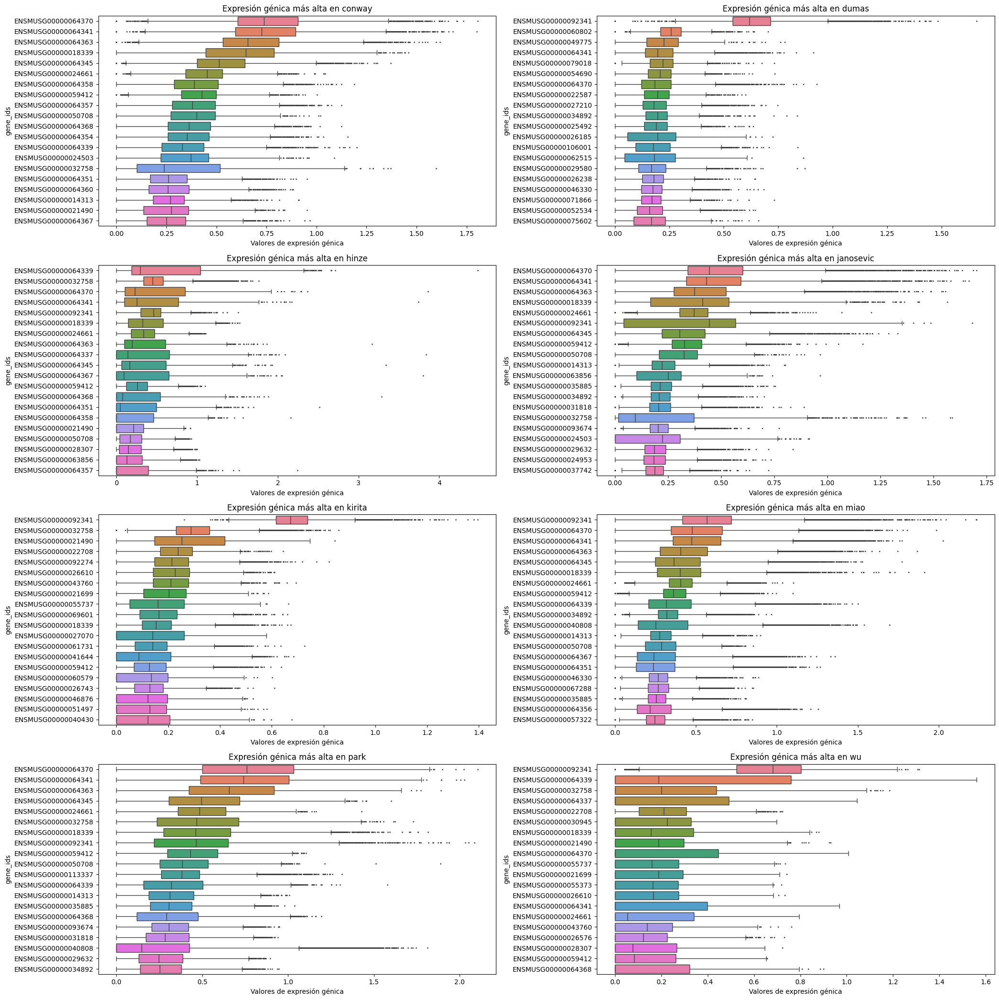

In [3]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np

# Paso 2: Visualizar la distribución de expresión génica

# Lista de variables que contienen los datasets
datasets = [adata_conway, adata_dumas, adata_hinze, adata_janosevic, adata_kirita, adata_miao, adata_park, adata_wu]

# Lista de nombres de los datasets
nombres_datasets = ['conway', 'dumas', 'hinze', 'janosevic', 'kirita', 'miao', 'park', 'wu']

# Aumentar el tamaño de cada gráfico en un 10%
figsize = (15 * 1.4, 15 * 1.4)

# Configuración de subplots
filas = 4
columnas = 2

# Crear una figura y ejes para la gráfica con el nuevo tamaño
fig, axs = plt.subplots(filas, columnas, figsize=figsize)

# Realizar análisis descriptivos y visualizaciones para cada dataset
for i, (dataset, nombre) in enumerate(zip(datasets, nombres_datasets)):
    if dataset is not None:  # Verificar si dataset no es None
        # Crear el gráfico de expresión génica más alta
        ax = axs[i // columnas, i % columnas]
        sc.pl.highest_expr_genes(dataset, n_top=20, log=False, show=False, ax=ax)
        
        # Quitar el "% of total counts" del eje X
        ax.set_xlabel("Valores de expresión génica")
        
        # Remover el texto "% of total counts" del eje X
        x_labels = [item.get_text().replace('% of total counts', '') for item in ax.get_xticklabels()]
        ax.set_xticklabels(x_labels)
        
        # Dar un título a cada subplot
        ax.set_title(f'Expresión génica más alta en {nombre}')

# Ajustar el espaciado entre subgráficos
plt.tight_layout()

# Guardar la imagen como un archivo PNG
plt.savefig('/home/a/Escritorio/TFM/plots/expresion_genes_mas_alta.png')

# Mostrar la gráfica
plt.show()


/home/a/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



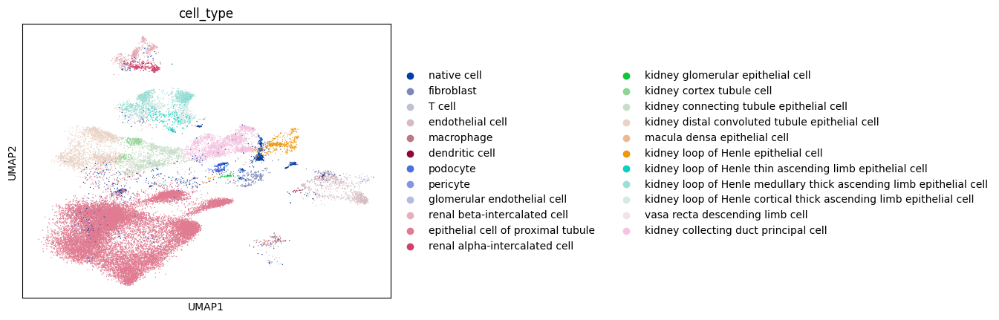

<Figure size 640x480 with 0 Axes>

In [50]:
# Paso 3: Visualizar UMAP si está disponible
if 'X_umap' in adata_hinze.obsm_keys():
    sc.pl.umap(adata_hinze, color='cell_type')

    # Guardar la imagen en el mismo archivo que el histograma de clusters
    plt.savefig('/home/a/Escritorio/TFM/plots/distribucion_UMAP_clusters.png', bbox_inches='tight')

else:
    print("No se encontró información de UMAP en el objeto 'adata_hinze'.")


In [27]:
# Convertir la matriz dispersa a un DataFrame de pandas
df = pd.DataFrame.sparse.from_spmatrix(adata_hinze.X)

# Convertir los datos dispersos a formato denso
df_dense = adata_hinze.X.toarray()

# Estadísticas descriptivas de las variables
print("Estadísticas descriptivas de las variables:")
print(pd.DataFrame(df_dense).describe())


Estadísticas descriptivas de las variables:
              0             1             2             3             4      \
count  30586.000000  30586.000000  30586.000000  30586.000000  30586.000000   
mean       0.004473      0.001898      0.016680      0.015598      0.004079   
std        0.058179      0.040547      0.110777      0.109761      0.058970   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.000000      0.000000      0.000000      0.000000      0.000000   
50%        0.000000      0.000000      0.000000      0.000000      0.000000   
75%        0.000000      0.000000      0.000000      0.000000      0.000000   
max        1.820495      1.741595      2.038237      2.423972      1.890815   

              5             6             7             8             9      \
count  30586.000000  30586.000000  30586.000000  30586.000000  30586.000000   
mean       0.008499      0.007828      0.018066      0.005066      0.004331   
std    

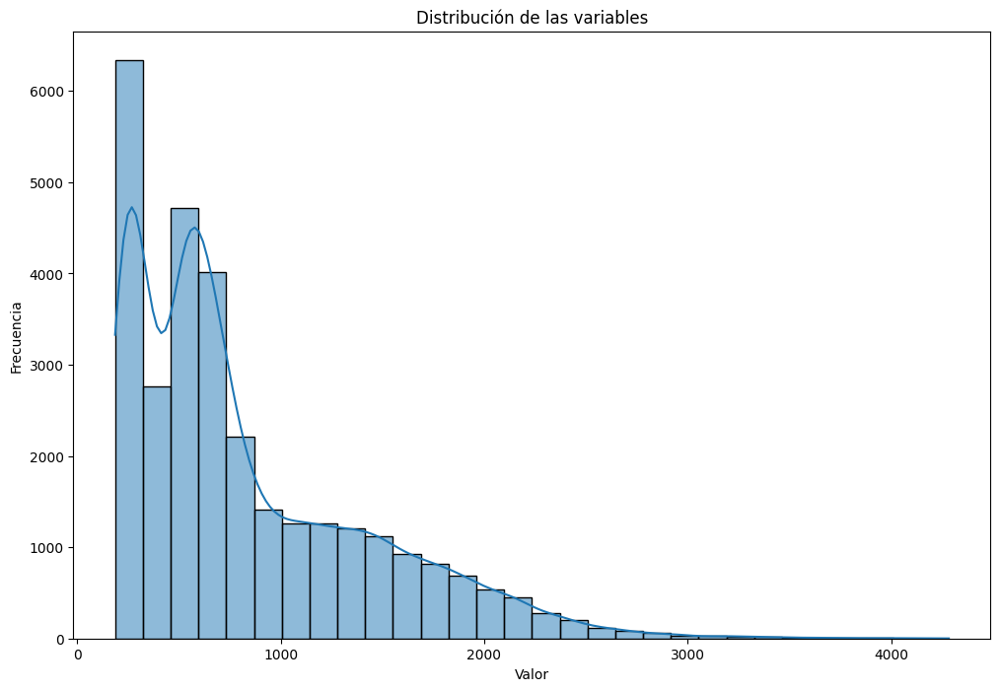

In [8]:
# Obtener la longitud de la matriz dispersa
n_samples = adata_hinze.X.shape[0]

# Visualización de la distribución de las variables
plt.figure(figsize=(12, 8))
sns.histplot(data=adata_hinze.X.getnnz(axis=1), bins=30, kde=True)
plt.title('Distribución de las variables')
plt.xlabel('Valor')
plt.ylabel('Frecuencia')
plt.show()


# Todos los datasets

In [25]:

# Lista de variables que contienen los datasets
datasets = [adata_conway, adata_dumas, adata_hinze, adata_janosevic, adata_kirita, adata_miao, adata_park, adata_wu]

# Lista de nombres de los datasets
nombres_datasets = ['conway', 'dumas', 'hinze', 'janosevic', 'kirita', 'miao', 'park', 'wu']

# Configuración de subplots
filas = 4
columnas = 2

# Realizar análisis descriptivos y visualizaciones para cada dataset
for i, (dataset, nombre) in enumerate(zip(datasets, nombres_datasets)):
    if dataset is not None:  # Verificar si dataset no es None
        # Balanceo del dataset
        fig = px.histogram(dataset.obs, x='cell_type', title=f'Balanceo del dataset {nombre}', labels={'cluster_label': 'Tipo de Cluster', 'count': 'Número de Células'})
        fig.update_xaxes(categoryorder='category ascending')
        fig.update_layout(xaxis=dict(tickangle=45))
        fig.show()


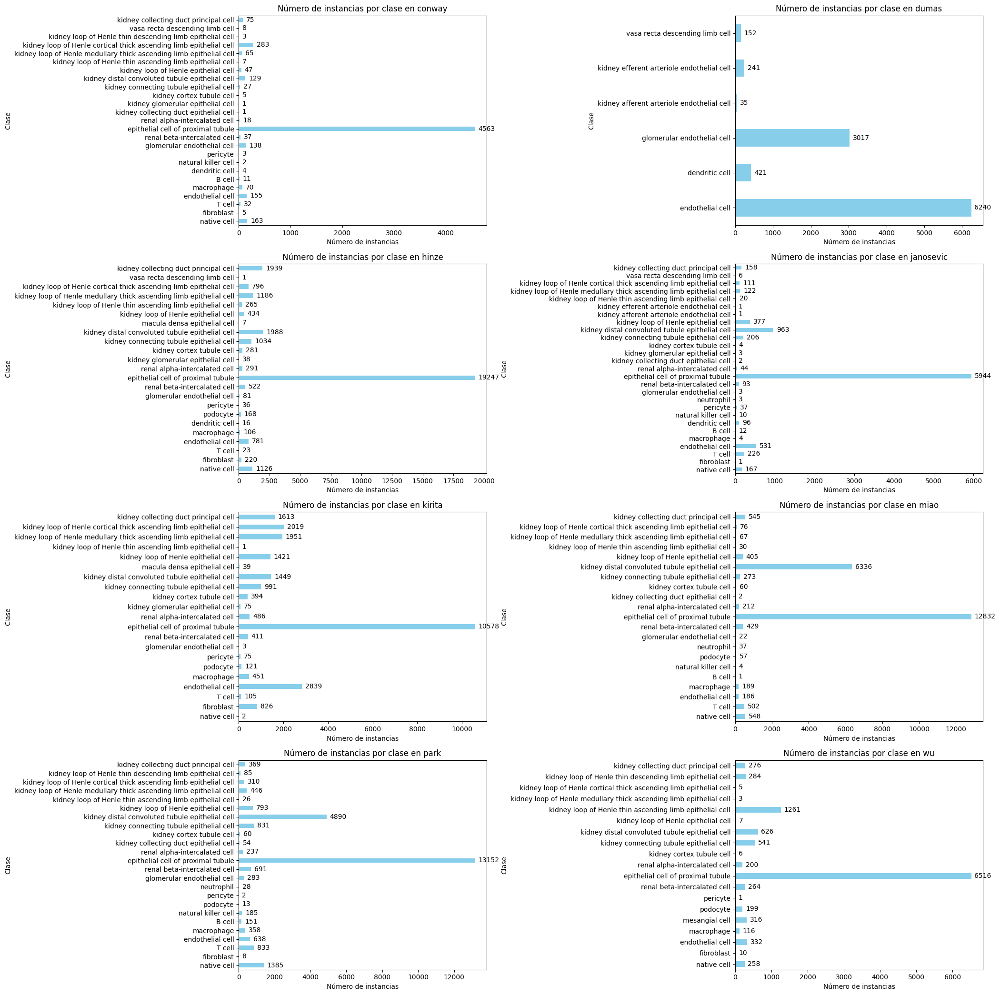

In [3]:
# Lista de variables que contienen los datasets
datasets = [adata_conway, adata_dumas, adata_hinze, adata_janosevic, adata_kirita, adata_miao, adata_park, adata_wu]

# Lista de nombres de los datasets
nombres_datasets = ['conway', 'dumas', 'hinze', 'janosevic', 'kirita', 'miao', 'park', 'wu']

# Aumentar el tamaño de cada gráfico en un 10%
figsize = (15 * 1.4, 15 * 1.4)

# Configuración de subplots
filas = 4
columnas = 2

# Crear una figura y ejes para la gráfica con el nuevo tamaño
fig, axs = plt.subplots(filas, columnas, figsize=figsize)

# Realizar análisis descriptivos y visualizaciones para cada dataset
for i, (dataset, nombre) in enumerate(zip(datasets, nombres_datasets)):
    if dataset is not None:  # Verificar si dataset no es None
        # Obtener el conteo de instancias por clase y ordenar alfabéticamente
        conteo = dataset.obs['cell_type'].value_counts().sort_index()

        # Graficar el número de instancias por clase en un gráfico de barras vertical
        ax = axs[i // columnas, i % columnas]
        bars = conteo.plot(kind='barh', ax=ax, color='skyblue')  # Histograma en posición vertical
        ax.set_title(f'Número de instancias por clase en {nombre}')
        ax.set_ylabel('Clase')
        ax.set_xlabel('Número de instancias')
        ax.tick_params(axis='y', rotation=0, labelsize='medium')  # Ajustar tamaño de etiquetas del eje y

        # Agregar el valor al final de cada barra
        for bar in bars.patches:
            ax.annotate(f'{bar.get_width():.0f}', 
                        xy=(bar.get_width(), bar.get_y() + bar.get_height() / 2),
                        xytext=(5, 0), 
                        textcoords='offset points',
                        ha='left', va='center')

# Ajustar el espaciado entre subgráficos
plt.tight_layout()

# Guardar la imagen como un archivo PNG
plt.savefig('histograma_clusters.png')

# Mostrar la gráfica
plt.show()


In [7]:
# Lista de variables que contienen los datasets
datasets = [adata_conway, adata_dumas, adata_hinze, adata_janosevic, adata_kirita, adata_miao, adata_park, adata_wu]

# Lista de nombres de los datasets
nombres_datasets = ['conway', 'dumas', 'hinze', 'janosevic', 'kirita', 'miao', 'park', 'wu']

# Realizar análisis descriptivos y visualizaciones para cada dataset
for dataset, nombre in zip(datasets, nombres_datasets):
    if dataset is not None:  # Verificar si dataset no es None
        # Obtener el conteo de instancias por clase
        conteo_por_clase = dataset.obs['cell_type'].value_counts()
        
        # Calcular el número total de instancias sumando el conteo de instancias por clase
        total_instancias = conteo_por_clase.sum()
        
        print(f"El número total de instancias en el dataset {nombre} es: {total_instancias}")


El número total de instancias en el dataset conway es: 5852
El número total de instancias en el dataset dumas es: 10106
El número total de instancias en el dataset hinze es: 30586
El número total de instancias en el dataset janosevic es: 9145
El número total de instancias en el dataset kirita es: 25850
El número total de instancias en el dataset miao es: 22813
El número total de instancias en el dataset park es: 25828
El número total de instancias en el dataset wu es: 11221


In [8]:
# Lista de variables que contienen los datasets
datasets = [adata_conway, adata_dumas, adata_hinze, adata_janosevic, adata_kirita, adata_miao, adata_park, adata_wu]

# Lista de nombres de los datasets
nombres_datasets = ['conway', 'dumas', 'hinze', 'janosevic', 'kirita', 'miao', 'park', 'wu']

# Realizar análisis descriptivos y visualizaciones para cada dataset
for dataset, nombre in zip(datasets, nombres_datasets):
    if dataset is not None:  # Verificar si dataset no es None
        # Obtener el número de columnas
        num_columnas = dataset.X.shape[1]
        
        print(f"El número de columnas en el dataset {nombre} es: {num_columnas}")


El número de columnas en el dataset conway es: 16653
El número de columnas en el dataset dumas es: 16653
El número de columnas en el dataset hinze es: 16653
El número de columnas en el dataset janosevic es: 16653
El número de columnas en el dataset kirita es: 16653
El número de columnas en el dataset miao es: 16653
El número de columnas en el dataset park es: 16653
El número de columnas en el dataset wu es: 16653


In [9]:
# Lista de variables que contienen los datasets
datasets = [adata_conway, adata_dumas, adata_hinze, adata_janosevic, adata_kirita, adata_miao, adata_park, adata_wu]

# Lista de nombres de los datasets
nombres_datasets = ['conway', 'dumas', 'hinze', 'janosevic', 'kirita', 'miao', 'park', 'wu']

# Contar el número de clusters diferentes en cada dataset
for dataset, nombre in zip(datasets, nombres_datasets):
    if dataset is not None:  # Verificar si dataset no es None
        clusters_diferentes = dataset.obs['cell_type'].nunique()
        print(f"En el dataset {nombre} hay {clusters_diferentes} clusters diferentes.")
    else:
        print(f"El dataset {nombre} no está disponible.")

En el dataset conway hay 25 clusters diferentes.
En el dataset dumas hay 6 clusters diferentes.
En el dataset hinze hay 23 clusters diferentes.
En el dataset janosevic hay 27 clusters diferentes.
En el dataset kirita hay 21 clusters diferentes.
En el dataset miao hay 21 clusters diferentes.
En el dataset park hay 24 clusters diferentes.
En el dataset wu hay 19 clusters diferentes.


In [10]:
# Lista de variables que contienen los datasets
datasets = [adata_conway, adata_dumas, adata_hinze, adata_janosevic, adata_kirita, adata_miao, adata_park, adata_wu]

# Lista de nombres de los datasets
nombres_datasets = ['conway', 'dumas', 'hinze', 'janosevic', 'kirita', 'miao', 'park', 'wu']

# Diccionario para almacenar los nombres de clusters de cada dataset
clusters_por_dataset = {}

# Recorrer cada dataset y almacenar los nombres de clusters
for dataset, nombre in zip(datasets, nombres_datasets):
    if dataset is not None:  # Verificar si dataset no es None
        clusters_por_dataset[nombre] = set(dataset.obs['cell_type'].unique())

# Encontrar la intersección de los nombres de clusters de todos los datasets
nombres_clusters_comunes = set.intersection(*clusters_por_dataset.values())

# Obtener el número máximo de clusters comunes
num_max_clusters = len(nombres_clusters_comunes)

# Mostrar el número máximo de clusters y los nombres de clusters comunes
print(f"El número máximo de clusters comunes en todos los datasets es: {num_max_clusters}")
print("Los nombres de los clusters comunes son:")
for nombre_cluster in sorted(nombres_clusters_comunes):
    print(nombre_cluster)

El número máximo de clusters comunes en todos los datasets es: 1
Los nombres de los clusters comunes son:
endothelial cell


In [11]:
# Lista de nombres de los datasets
nombres_datasets = ['conway', 'dumas', 'hinze', 'janosevic', 'kirita', 'miao', 'park', 'wu']

# Diccionario para almacenar los nombres de clusters de cada dataset
clusters_por_dataset = {nombre: set(dataset.obs['cell_type'].unique()) for nombre, dataset in zip(nombres_datasets, datasets) if dataset is not None}

# Obtener la lista de todos los clusters únicos
todos_clusters = sorted(set.union(*[set(clusters) for clusters in clusters_por_dataset.values()]))

# Construir el DataFrame con los nombres de los clusters como índice y los nombres de los datasets como columnas
df = pd.DataFrame(0, columns=nombres_datasets, index=todos_clusters)

# Rellenar el DataFrame con 0 o 1 dependiendo de si el cluster se encuentra en el dataset o no
for dataset, clusters in clusters_por_dataset.items():
    for cluster in todos_clusters:
        df.loc[cluster, dataset] = 1 if cluster in clusters else 0

# Exportar el DataFrame a un archivo CSV
df.to_csv('clusters.csv')

# Mostrar el DataFrame
df

,conway,dumas,hinze,janosevic,kirita,miao,park,wu
B cell,1,0,0,1,0,1,1,0
T cell,1,0,1,1,1,1,1,0
dendritic cell,1,1,1,1,0,0,0,0
endothelial cell,1,1,1,1,1,1,1,1
epithelial cell of proximal tubule,1,0,1,1,1,1,1,1
fibroblast,1,0,1,1,1,0,1,1
glomerular endothelial cell,1,1,1,1,1,1,1,0
kidney afferent arteriole endothelial cell,0,1,0,1,0,0,0,0
kidney collecting duct epithelial cell,1,0,0,1,0,1,1,0
kidney collecting duct principal cell,1,0,1,1,1,1,1,1


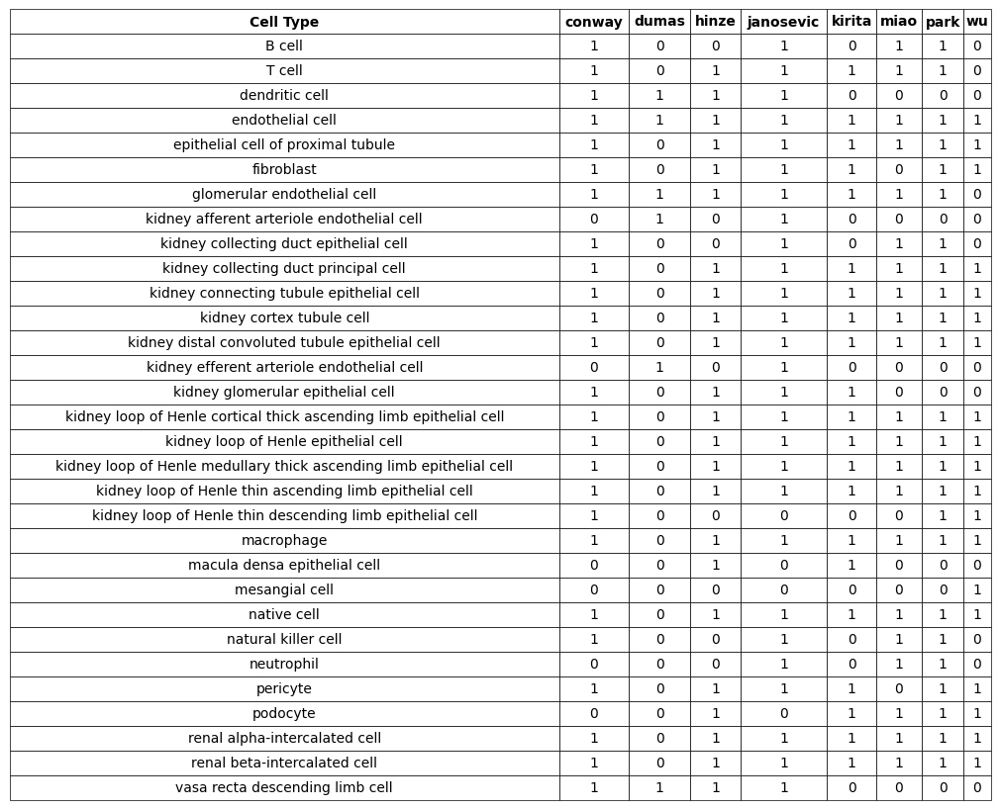

In [54]:
# Generar la imagen de la tabla
fig, ax = plt.subplots(figsize=(12, 8))  # Ajustar el tamaño de la figura según sea necesario
ax.axis('tight')
ax.axis('off')
tabla = ax.table(cellText=df.reset_index().values,
                 colLabels=['Cell Type'] + df.columns.tolist(),
                 cellLoc='center',
                 loc='center',
                 colWidths=[0.2] * (len(df.columns) + 1))  # Ajustar los anchos de columna

tabla.auto_set_font_size(False)
tabla.set_fontsize(10)  # Tamaño de fuente ajustado

# Ajustar el diseño de celda y encabezado
for key, cell in tabla.get_celld().items():
    cell.set_linewidth(0.5)
    if key[0] == 0:
        cell.set_text_props(fontweight='bold')

# Ajustar el espaciado entre las filas
tabla.auto_set_column_width(col=list(range(len(df.columns) + 1)))  # Ajustar automáticamente el ancho de las columnas
tabla.scale(1, 1.5)  # Ajustar el espaciado vertical

# Guardar la imagen con mejor resolución
plt.savefig("/home/a/Escritorio/TFM/plots/clusters_compartidos.png", dpi=300, bbox_inches='tight')  # Ajustar la resolución según sea necesario
plt.show()

In [12]:
clases_interesantes = ['T cell', 'endothelial cell', 'epithelial cell of proximal tubule',
                      'glomerular endothelial cell', 'kidney collecting duct principal cell',
                      'kidney connecting tubule epithelial cell', 'kidney cortex tubule cell',
                      'kidney distal convoluted tubule epithelial cell',
                      'kidney loop of Henle cortical thick ascending limb epithelial cell',
                      'kidney loop of Henle epithelial cell',
                      'kidney loop of Henle medullary thick ascending limb epithelial cell',
                      'kidney loop of Henle thin ascending limb epithelial cell',
                      'macrophage', 'native cell', 'renal alpha-intercalated cell',
                      'renal beta-intercalated cell']

# Aplicar el filtro para cada conjunto de datos
adata_conway_filtrado = adata_conway[adata_conway.obs['cell_type'].isin(clases_interesantes)]
adata_hinze_filtrado = adata_hinze[adata_hinze.obs['cell_type'].isin(clases_interesantes)]
adata_janosevic_filtrado = adata_janosevic[adata_janosevic.obs['cell_type'].isin(clases_interesantes)]
adata_kirita_filtrado = adata_kirita[adata_kirita.obs['cell_type'].isin(clases_interesantes)]
adata_miao_filtrado = adata_miao[adata_miao.obs['cell_type'].isin(clases_interesantes)]
adata_park_filtrado = adata_park[adata_park.obs['cell_type'].isin(clases_interesantes)]

# Ahora tienes cada conjunto de datos filtrado por las clases de interés
# Puedes realizar operaciones adicionales con estos conjuntos de datos si es necesario


In [56]:
adata_hinze_filtrado

View of AnnData object with n_obs × n_vars = 30100 × 16653
    obs: 'Origin', 'suspension_type', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'author_cell_type', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'cell_type_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'is_primary_data', 'development_stage_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'donor_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: 'schema_version', 'title', 'cell_type_colors'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

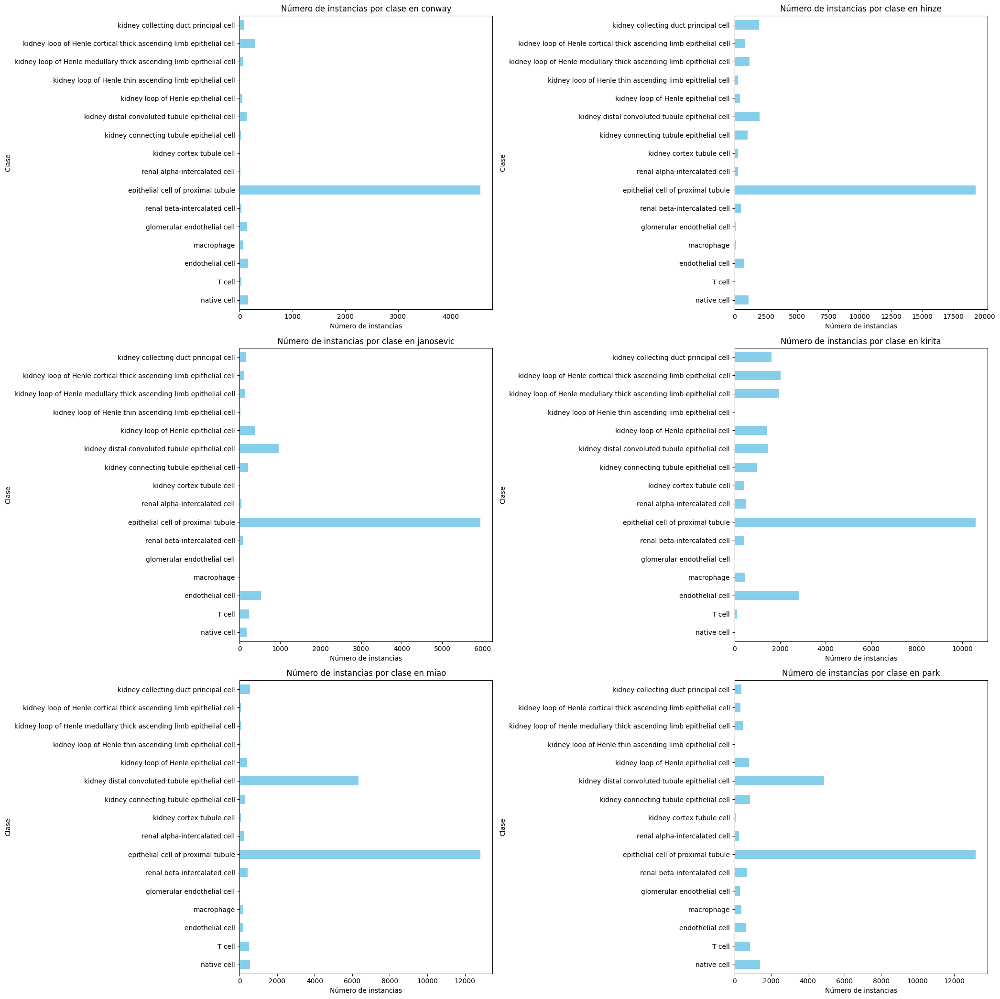

In [62]:
import matplotlib.pyplot as plt

datasets = [adata_conway_filtrado, adata_hinze_filtrado, adata_janosevic_filtrado, adata_kirita_filtrado, adata_miao_filtrado, adata_park_filtrado]

# Lista de nombres de los datasets
nombres_datasets = ['conway', 'hinze', 'janosevic', 'kirita', 'miao', 'park']

# Aumentar el tamaño de cada gráfico en un 10%
figsize = (15 * 1.4, 15 * 1.4)

# Configuración de subplots
filas = 3
columnas = 2

# Crear una figura y ejes para la gráfica con el nuevo tamaño
fig, axs = plt.subplots(filas, columnas, figsize=figsize)

# Realizar análisis descriptivos y visualizaciones para cada dataset
for i, (dataset, nombre) in enumerate(zip(datasets, nombres_datasets)):
    if dataset is not None:  # Verificar si dataset no es None
        # Obtener el conteo de instancias por clase y ordenar alfabéticamente
        conteo = dataset.obs['cell_type'].value_counts().sort_index()

        # Graficar el número de instancias por clase en un gráfico de barras vertical
        ax = axs[i // columnas, i % columnas]
        conteo.plot(kind='barh', ax=ax, color='skyblue')  # Histograma en posición vertical
        ax.set_title(f'Número de instancias por clase en {nombre}')
        ax.set_ylabel('Clase')
        ax.set_xlabel('Número de instancias')
        ax.tick_params(axis='y', rotation=0, labelsize='medium')  # Ajustar tamaño de etiquetas del eje y

# Ajustar el espaciado entre subgráficos
plt.tight_layout()

# Guardar la imagen como un archivo PNG
plt.savefig('/home/a/Escritorio/TFM/plots/histograma_clusters_datasets_filtrados_16_clases.png')

# Mostrar la gráfica
plt.show()


In [13]:
import anndata

# Suponiendo que los conjuntos de datos filtrados son: adata_conway_filtrado, adata_hinze_filtrado, etc.

# Lista de los conjuntos de datos filtrados
datasets_filtrados = [adata_conway_filtrado, adata_hinze_filtrado, adata_janosevic_filtrado,
                      adata_kirita_filtrado, adata_miao_filtrado, adata_park_filtrado]

# Concatenar los conjuntos de datos filtrados en un solo objeto AnnData
adata_completo = anndata.concat(datasets_filtrados, join='outer', index_unique=None)

# Ahora tienes un solo objeto AnnData que contiene la unión de todos los conjuntos de datos filtrados


In [37]:
fig = px.histogram(adata_completo.obs, x='cell_type', title='Distribución de células por clase', labels={'cell_type': 'Tipo Celular', 'count': 'Número de Células'})
fig.update_layout(xaxis=dict(tickangle=45),
                  yaxis_title='Número de Células')
fig.update_traces(marker_color='skyblue', marker_line_color='black',
                  marker_line_width=1.5, opacity=0.6)
for annotation in fig.layout.annotations:
    annotation.text = annotation.text.split('=')[1]
fig.show()

/tmp/ipykernel_8307/606072565.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




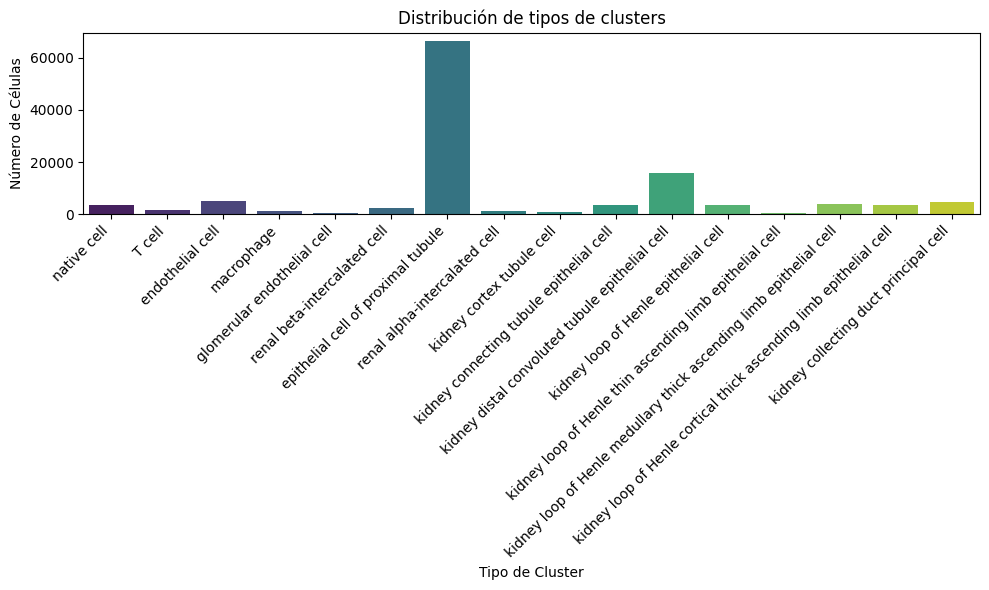

In [60]:
# Ejemplo de visualización: Distribución de tipos de clusters
plt.figure(figsize=(10, 6))
sns.countplot(x='cell_type', data=adata_completo.obs, palette='viridis')
plt.title('Distribución de tipos de clusters')
plt.xlabel('Tipo de Cluster')
plt.ylabel('Número de Células')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
# Guardar la imagen como un archivo PNG
plt.savefig('/home/a/Escritorio/TFM/plots/histograma_clusters_datasets_concatenados_16_clases.png')
plt.show()

In [36]:
adata_completo.shape

(117615, 16653)

In [ ]:
# Lista de variables que contienen los datasets que comparten 16 clases
datasets_16 = [adata_conway, adata_hinze, adata_janosevic, adata_kirita, adata_miao, adata_park]

clases_interesantes = ['T cell', 'endothelial cell', 'epithelial cell of proximal tubule',
                      'glomerular endothelial cell', 'kidney collecting duct principal cell',
                      'kidney connecting tubule epithelial cell', 'kidney cortex tubule cell',
                      'kidney distal convoluted tubule epithelial cell',
                      'kidney loop of Henle cortical thick ascending limb epithelial cell',
                      'kidney loop of Henle epithelial cell',
                      'kidney loop of Henle medullary thick ascending limb epithelial cell',
                      'kidney loop of Henle thin ascending limb epithelial cell',
                      'macrophage', 'native cell', 'renal alpha-intercalated cell',
                      'renal beta-intercalated cell']

# Iterar sobre cada conjunto de datos y filtrar las instancias
for adata in datasets_16:
    adata_filtrado = adata[adata.obs['cell_type'].isin(clases_interesantes)]
    # Realizar las operaciones necesarias con adata_filtrado
    # Por ejemplo, guardar adata_filtrado en un nuevo archivo, etc.


/tmp/ipykernel_8889/2190839585.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='cell_type', data=adata.obs, palette='viridis')


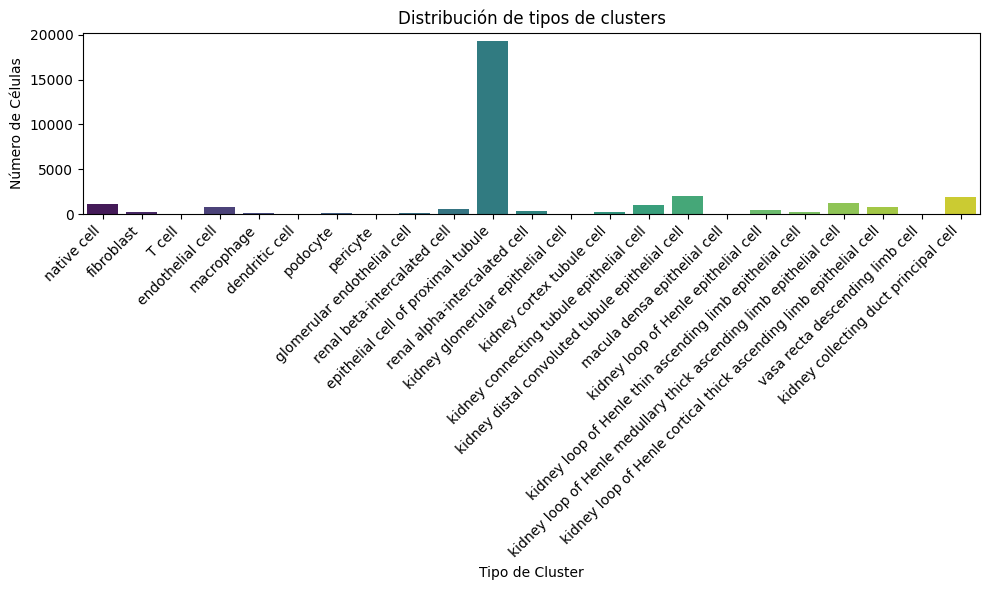

In [6]:
# Ejemplo de visualización: Distribución de tipos de clusters
plt.figure(figsize=(10, 6))
sns.countplot(x='cell_type', data=adata.obs, palette='viridis')
plt.title('Distribución de tipos de clusters')
plt.xlabel('Tipo de Cluster')
plt.ylabel('Número de Células')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()